In [1]:
using Plots
#gr()
pyplot()

Plots.PyPlotBackend()

In [2]:
include("src/Lsystem.jl")

update_angle (generic function with 1 method)

In [3]:
basic_rules = Dict{String,String}("F" => "FF", "G" => "F[+G][-G]F[+G][-G]FG")

Dict{String,String} with 2 entries:
  "G" => "F[+G][-G]F[+G][-G]FG"
  "F" => "FF"

In [4]:
example = mult_evol_lsystem("G",basic_rules,3)

"FFFF[+FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG][-FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG]FFFF[+FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG][-FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG]FFFFFF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG"

In [5]:
splitted = split(example,"");

In [6]:
example

"FFFF[+FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG][-FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG]FFFF[+FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG][-FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG]FFFFFF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FF[+F[+G][-G]F[+G][-G]FG][-F[+G][-G]F[+G][-G]FG]FFF[+G][-G]F[+G][-G]FG"

In [7]:
plot();

In [8]:
let    
    global x = 0.
    global y = 0.
    global a = 0.
    global p
    global variables=[(x,y,a)]
    Δ = 27.5
    global da = Δ/180*π
    for s in splitted
        if s == "F" || s == "G"
            p,x,y=turtle_step(x,y,s,a)
        elseif s == "+" || s == "-"
            a = update_angle(a,da,1,s)
        elseif s == "["
            push!(variables,(x,y,a))
            x,y,a = variables[end]
        elseif s == "]"
            x,y,a = variables[end]
            pop!(variables)
        end
        p
    end
end

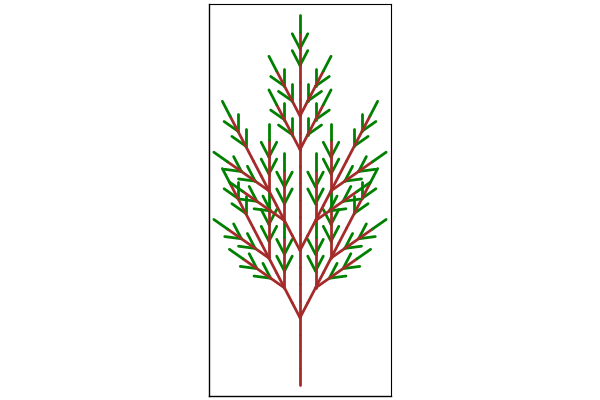

In [9]:
p

In [306]:
png(p,"./figs/example.png")

# The one from Flake 6.5

In [10]:
fl65 = Dict{String,String}("F" => "F[-F]F[+F]F")

Dict{String,String} with 1 entry:
  "F" => "F[-F]F[+F]F"

In [11]:
HW = mult_evol_lsystem("F",fl65,3)

"F[-F]F[+F]F[-F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F]F[-F]F[+F]F[-F[-F]F[+F]F[-F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F]F[-F]F[+F]F]F[-F]F[+F]F[-F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F[-F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F]F[-F]F[+F]F]F[-F]F[+F]F[-F[-F]F[+F]F]F[-F]F[+F]F[+F[-F]F[+F]F]F[-F]F[+F]F"

In [12]:
splitted = split(HW,"");

In [13]:
plot();
let    
    global x = 0.
    global y = 0.
    global a = 0.
    global p
    global variables=[(x,y,a)]
    Δ = 25
    global da = Δ/180*π
    for s in splitted
        if s == "F" || s == "G"
            p,x,y=turtle_step(x,y,s,a)
        elseif s == "+" || s == "-"
            a = update_angle(a,da,1,s)
        elseif s == "["
            push!(variables,(x,y,a))
            x,y,a = variables[end]
        elseif s == "]"
            x,y,a = variables[end]
            pop!(variables)
        end
        p
    end
end

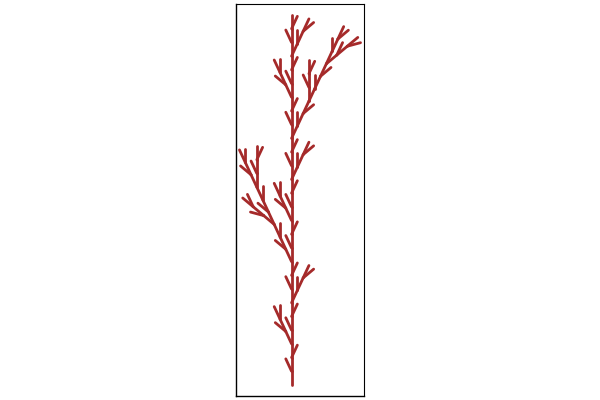

In [14]:
p

In [15]:
png(p,"./figs/flake65")

# My fractal

In [16]:
mf = Dict{String,String}("F" => "FF[+F][-F]","+" => "+F[+2F][-2F]","-"=>"-F[-3F][+3F]")

Dict{String,String} with 3 entries:
  "-" => "-F[-3F][+3F]"
  "+" => "+F[+2F][-2F]"
  "F" => "FF[+F][-F]"

In [40]:
HW2 = mult_evol_lsystem("F",mf,4);

In [41]:
splitted = split(HW2,"");

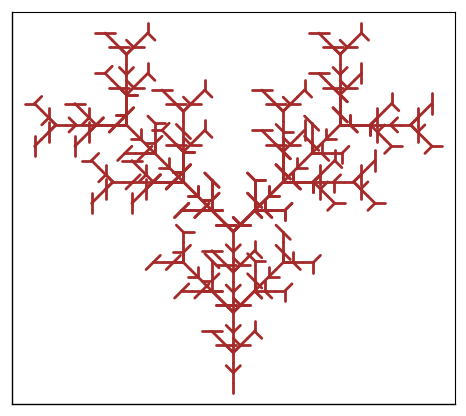

┌ Info: Saved animation to 
│   fn = /home/ollin/Dropbox/enlace_hacia_documentos/UVM/courses/ModelingComplexSystems/assignments/hw2/tmp.gif
└ @ Plots /home/ollin/.julia/packages/Plots/UtVfv/src/animation.jl:90


Plots.AnimatedGif("/home/ollin/Dropbox/enlace_hacia_documentos/UVM/courses/ModelingComplexSystems/assignments/hw2/tmp.gif")

In [45]:
plot();
let    
    global x = 0.
    global y = 0.
    global a = 0.
    global p
    global variables=[(x,y,a)]
    global times = 1
    Δ = 45
    global da = Δ/180*π
    @gif for s in splitted
        if s == "F" || s == "G"
            p,x,y=turtle_step(x,y,s,a)
        elseif occursin(r"[0-9]",s)
            times = parse(Int64,s)
        elseif s == "+" || s == "-"
            a = update_angle(a,da,times,s)
            times = 1
        elseif s == "["
            push!(variables,(x,y,a))
            x,y,a = variables[end]
        elseif s == "]"
            x,y,a = variables[end]
            pop!(variables)
        end
        p
    end
end

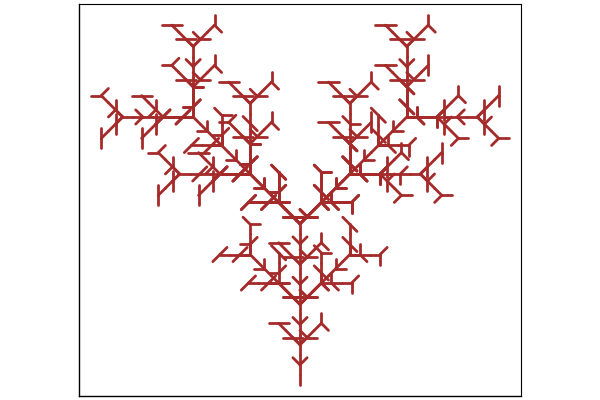

In [43]:
p

In [29]:
png(p,"./figs/myfractal1")

In [34]:
png(p,"./figs/myfractal2")

In [39]:
png(p,"./figs/myfractal3")

In [44]:
png(p,"./figs/myfractal4")

In [21]:
png(p,"./figs/myfractal5")

In [314]:
png(p,"./figs/myfractal6")

# Other fractals

# Sierpinski

In [48]:
sp = Dict{String,String}("F" => "F--F--F--GG","G" => "GG")

Dict{String,String} with 2 entries:
  "G" => "GG"
  "F" => "F--F--F--GG"

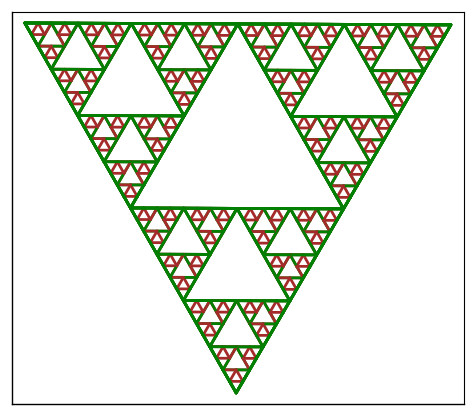

In [77]:
 for it ∈ 1:5
    tsp = mult_evol_lsystem("F--F--F",sp,it);
    splitted = split(tsp,"");
    plot();
    let    
        global x = 0.
        global y = 0.
        global a = 11.
        global p
        global variables=[(x,y,a)]
        global times = 1
        Δ = 60
        global da = Δ/180*π
        for s in splitted
            if s == "F" || s == "G"
                p,x,y=turtle_step(x,y,s,a)
            elseif occursin(r"[0-9]",s)
                times = parse(Int64,s)
            elseif s == "+" || s == "-"
                a = update_angle(a,da,times,s)
                times = 1
            elseif s == "["
                push!(variables,(x,y,a))
                x,y,a = variables[end]
            elseif s == "]"
                x,y,a = variables[end]
                pop!(variables)
            end
            p
        end
    end
    png(p,"./figs/sierpinski/sierpinski_$it")
end

# Penrose snowflake

In [151]:
pen = Dict{String,String}("F" => "F4-F4-F10-F++F4-F")

Dict{String,String} with 1 entry:
  "F" => "F4-F4-F10-F++F4-F"

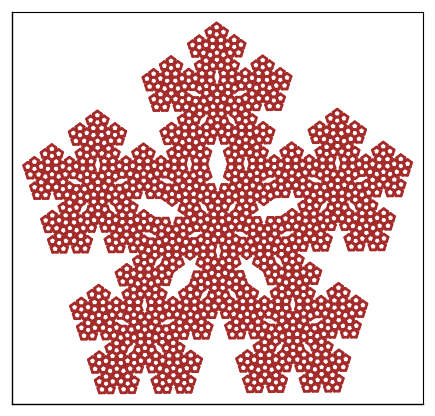

In [152]:
 for it ∈ 1:4
    ps = mult_evol_lsystem("F4-F4-F4-F4-F",pen,it);
    splitted = split(ps,"");
    plot();
    let    
        global x = 0.
        global y = 0.
        global a = -0.95
        global p
        global variables=[(x,y,a)]
        global times = 1.
        Δ = 18
        global da = Δ/180*π
        for s in splitted
            if s == "F" || s == "G"
                p,x,y=turtle_step(x,y,s,a)
            elseif occursin(r"[0-9]",s)
                if typeof(times) == Float64
                    times = parse(Int64,s)
                elseif typeof(times) == Int64
                    times = string(times)
                    times = times * s
                    times = parse(Int64,times)
                end
            elseif s == "+" || s == "-"
                a = update_angle(a,da,times,s)
                times = 1.
            elseif s == "["
                push!(variables,(x,y,a))
                x,y,a = variables[end]
            elseif s == "]"
                x,y,a = variables[end]
                pop!(variables)
            end
            p
        end
    end
    png(p,"./figs/penrose/penrose_$it")
end

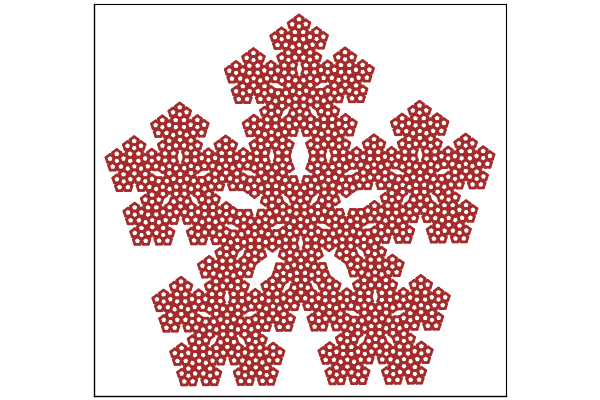

In [150]:
p

# Square-spikes

In [153]:
ss = Dict{String,String}("F" => "F17-F34+F17-F")

Dict{String,String} with 1 entry:
  "F" => "F17-F34+F17-F"

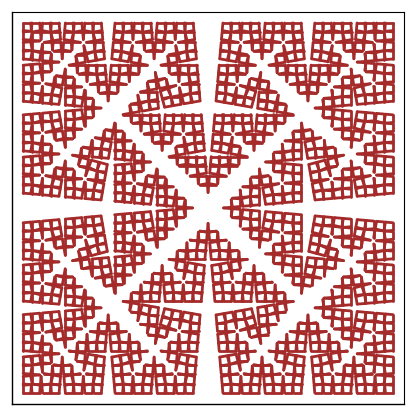

In [155]:
 for it ∈ 1:5
    ssf = mult_evol_lsystem("F18-F18-F18-F",ss,it);
    splitted = split(ssf,"");
    plot();
    let    
        global x = 0.
        global y = 0.
        global a = 0.
        global p
        global variables=[(x,y,a)]
        global times = 1.
        Δ = 5
        global da = Δ/180*π
        for s in splitted
            if s == "F" || s == "G"
                p,x,y=turtle_step(x,y,s,a)
            elseif occursin(r"[0-9]",s)
                if typeof(times) == Float64
                    times = parse(Int64,s)
                elseif typeof(times) == Int64
                    times = string(times)
                    times = times * s
                    times = parse(Int64,times)
                end
            elseif s == "+" || s == "-"
                a = update_angle(a,da,times,s)
                times = 1.
            elseif s == "["
                push!(variables,(x,y,a))
                x,y,a = variables[end]
            elseif s == "]"
                x,y,a = variables[end]
                pop!(variables)
            end
            p
        end
    end
    png(p,"./figs/spikes/spikes_$it")
end

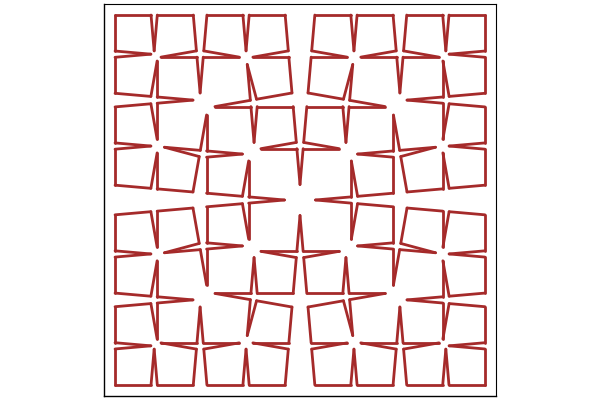

In [109]:
p